In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import KDTree
import sys 
from sys import float_info
import copy
from datetime import timedelta
from IPython.display import HTML
from PIL import Image, ImageDraw, ImageOps, ImageFont
from IPython.display import Image as Img
from IPython.display import display
import matplotlib.colors as mcolors
import utils
import dyn_models
from params_names import *

EPS = float_info.epsilon
%matplotlib inline



# Example for Model Predictive Path Integral for Decentralized Multi-Agent Collision Avoidance

## Example Setup

In [8]:
CIRC_R = 6 # size of the circle
AGENTS_NUM = 5 # number of agents

start_states, goal_states = utils.circle_instance(CIRC_R, AGENTS_NUM)
alg_params = dict()
default_agent_params = dict()
exp_params = dict()

max_sim_steps = 250
dt = 0.1
goal_xy_offset = 0.3

"""
Differential-drive dynamics
"""

default_r_vis = 30.0
default_ag_size = 0.3
default_v_max = 1.0
default_v_min = -0.01
default_w_max = 2.0
default_w_min = -2.0
agent_models = [dyn_models.DiffDriveDyn() for i in range(AGENTS_NUM)]

alg_params[SAMPLE_BATCH_SIZE] = 700
alg_params[SAMPLE_TIME_STEPS] = 20
alg_params[TIME_STEP] = dt
alg_params[INIT_VALUE] = np.array([0.0, 0.0])
alg_params[CONTROL_MEAN] = np.array([0.0, 0.0])
alg_params[CONTROL_COV] = np.array([1.0, 0.0, 0.0, 6.0], dtype=np.float64).reshape(
    (2, 2)
)
alg_params[RUNNING_COST_WEIGH] = 395.0
alg_params[TERMINAL_WEIGHT] = 1600
alg_params[SOFTMAX_TEMPERATURE] = 0.25
alg_params[MA_COST_EN] = True
alg_params[MA_DIST_WEIGHT] = 750
alg_params[MA_COLLISION_WEIGHT] = 10000000.0
alg_params[MA_DIST_THREASHOLD] = 3.5
alg_params[USE_CAR_LIKE_DYN] = False
alg_params[K_ALPHA] = -2.96
alg_params[RAD_EPS] = 0.05
alg_params[VELOCITY_COST_WEIGHT] = 0.5
alg_params[TERMINAL_LOOKAHEAD_DISTANCE] = 2.0
alg_params[MA_EN_CLOSE_TO_GOAL_DIST] = 1.0
alg_params[MA_EN_CLOSE_TO_GOAL_TS] = 3
alg_params[ORCA_TIME_BOUNDARY] = 1.0
alg_params[ORCA_RESPONSIBILITY_FACTOR] = 0.5
alg_params[MA_EXCLUDE_COLLISION_TRAJ] = True
alg_params[VELOCITY_COST_CLOSE_TO_GOAL_DIST] = 0.4


"""
Car-like dynamics
"""
# max_sim_steps = 350

# default_dist_between_axles = 0.2
# default_r_vis = 30.0
# default_ag_size = 0.3
# agent_models = [dyn_models.CarLikeDyn(default_dist_between_axles) for i in range(AGENTS_NUM)]
# default_v_max = 1.0
# default_v_min = -0.2
# default_w_max = np.pi / 3
# default_w_min = -np.pi / 3


# alg_params[SAMPLE_BATCH_SIZE] = 700
# alg_params[SAMPLE_TIME_STEPS] = 50
# alg_params[TIME_STEP] = dt
# alg_params[INIT_VALUE] = np.array([0.0, 0.0])
# alg_params[CONTROL_MEAN] = np.array([0.0, 0.0])
# alg_params[CONTROL_COV] = np.array([0.035, 0.0, 0.0, 0.03], dtype=np.float64).reshape(
#     (2, 2)
# )
# alg_params[RUNNING_COST_WEIGH] = 395.0
# alg_params[TERMINAL_WEIGHT] = 2000
# alg_params[SOFTMAX_TEMPERATURE] = 0.25
# alg_params[MA_COST_EN] = True
# alg_params[MA_DIST_WEIGHT] = 1550
# alg_params[MA_COLLISION_WEIGHT] = 100000000.0
# alg_params[MA_DIST_THREASHOLD] = 4.0
# alg_params[USE_CAR_LIKE_DYN] = True
# alg_params[DIST_BETWEEN_AXLES] = default_dist_between_axles
# alg_params[K_ALPHA] = -2.96
# alg_params[RAD_EPS] = 0.05
# alg_params[VELOCITY_COST_WEIGHT] = 0.5
# alg_params[TERMINAL_LOOKAHEAD_DISTANCE] = 2.0
# alg_params[MA_EN_CLOSE_TO_GOAL_DIST] = 1.0
# alg_params[MA_EN_CLOSE_TO_GOAL_TS] = 3
# alg_params[ORCA_TIME_BOUNDARY] = 1.0
# alg_params[ORCA_RESPONSIBILITY_FACTOR] = 0.5
# alg_params[MA_EXCLUDE_COLLISION_TRAJ] = True
# alg_params[VELOCITY_COST_CLOSE_TO_GOAL_DIST] = 0.3


exp_params[MAX_EXP_STEPS] = max_sim_steps
exp_params[EXP_TIME_STEP] = dt
exp_params[XY_GOAL_TOLERANCE] = goal_xy_offset

default_agent_params[VISIBILITY_RADIUS] = default_r_vis
default_agent_params[AGENT_SIZE] = default_ag_size
default_agent_params[DIFF_DRIVE_V_MAX] = default_v_max
default_agent_params[DIFF_DRIVE_V_MIN] = default_v_min
default_agent_params[DIFF_DRIVE_W_MAX] = default_w_max
default_agent_params[DIFF_DRIVE_W_MIN] = default_w_min

agents_params = [default_agent_params] * AGENTS_NUM

## Launch Experiment

In [9]:
success, collisions, steps, t_dur, log_state, log_traj = utils.launch_mppi(
    start_states,
    goal_states,
    AGENTS_NUM,
    copy.copy(agents_params),
    copy.copy(alg_params),
    copy.copy(exp_params),
    agent_models,
    True,
    True,
    None,
    0.0,
    0.0,
    0.0,
)
log_np = np.stack(log_state, axis=0)

## Results

In [10]:
td_h_m_s = str(timedelta(seconds=t_dur)).split(':')

print("Success:", success)
print("Collisions:", collisions)
print("Steps:", steps)
print(f"Time: {td_h_m_s[1]} m : {td_h_m_s[2]:.2}s")
print("Time per agent's step:", t_dur/(AGENTS_NUM * steps))


Success: True
Collisions: 0.0
Steps: 143
Time: 00 m : 04s
Time per agent's step: 0.006616418011538633


## Static Visualization

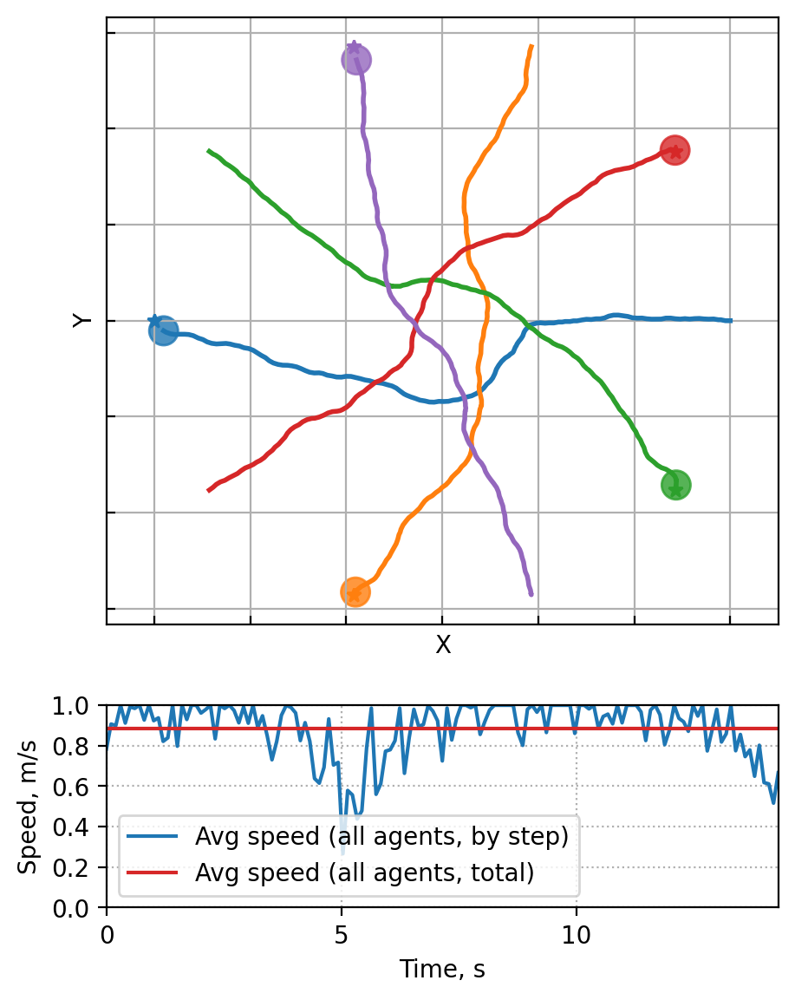

In [11]:
resolution = 1000
my_dpi = 200
show_vel = True

if show_vel:
    fig, ax = plt.subplots(nrows=2, ncols=1, gridspec_kw={'height_ratios':[6,2]}, figsize=(resolution/my_dpi, 8/6 *resolution/my_dpi), dpi=my_dpi)
    ax2 = ax[1]
    ax = ax[0]
else:
    fig, ax = plt.subplots(figsize=(resolution/my_dpi, resolution/my_dpi), dpi=my_dpi)

width =  10
height = 10

ax.axis('equal')
ax.grid(True)
ax.axes.xaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([])
ax.tick_params(axis="y",direction="in", pad=-20)
ax.tick_params(axis="x",direction="in", pad=-20)
ax.set_xlim((-7, 7))
ax.set_ylim((-7, 7))

colors = [name for name, color in mcolors.TABLEAU_COLORS.items()]
colors = colors[:5]

steps_num = log_np.shape[0]
agents_num = log_np.shape[1]

for a in range(agents_num):
    circle = plt.Circle(log_np[-1, a, 0:2], agents_params[a][AGENT_SIZE], color=colors[a%len(colors)], alpha=0.8)
    ax.add_patch(circle)

for a in range(agents_num):
    ax.plot(log_np[:, a, 0], log_np[:, a, 1], lw=2, color=colors[a%len(colors)])

for a in range(agents_num):
    ax.plot([goal_states[a, 0]],[goal_states[a, 1]], lw=2, color=colors[a%len(colors)], marker="*")


velocities = []
all_velocities = []
for step in range(len(log_np)-1):
    curr_avg_vel = 0
    for a in range(agents_num):
        curr_avg_vel += (np.linalg.norm(log_np[step+1, a, 0:2]-log_np[step, a, 0:2]) / 0.1) 
        all_velocities.append(np.linalg.norm(log_np[step+1, a, 0:2]-log_np[step, a, 0:2]) / 0.1)

    curr_avg_vel /= agents_num
    velocities.append(curr_avg_vel)

ax.set_ylabel("Y")
ax.set_xlabel("X")

if show_vel:
    time = np.linspace(0, (len(log_np)-1)*0.1, (len(log_np)-1))
    ax2.plot(time, velocities)
    mean_vel = np.array(all_velocities).mean()
    ax2.axhline(mean_vel, c='tab:red')

    ax2.set_ylim((0, 1.0))
    ax2.set_xlim((0, (len(log_np)-1)*0.1))
    ax2.yaxis.set_ticks(np.arange(0, 1.1, 0.2))
    ax2.xaxis.set_ticks(np.arange(0, (len(log_np)-1)*0.1, 5.0))
    ax2.legend(["Avg speed (all agents, by step)", "Avg speed (all agents, total)"], loc='lower left')
    ax2.grid( linestyle=':')
    ax2.set_ylabel("Speed, m/s")
    ax2.set_xlabel("Time, s")

## Dynamic Visualization

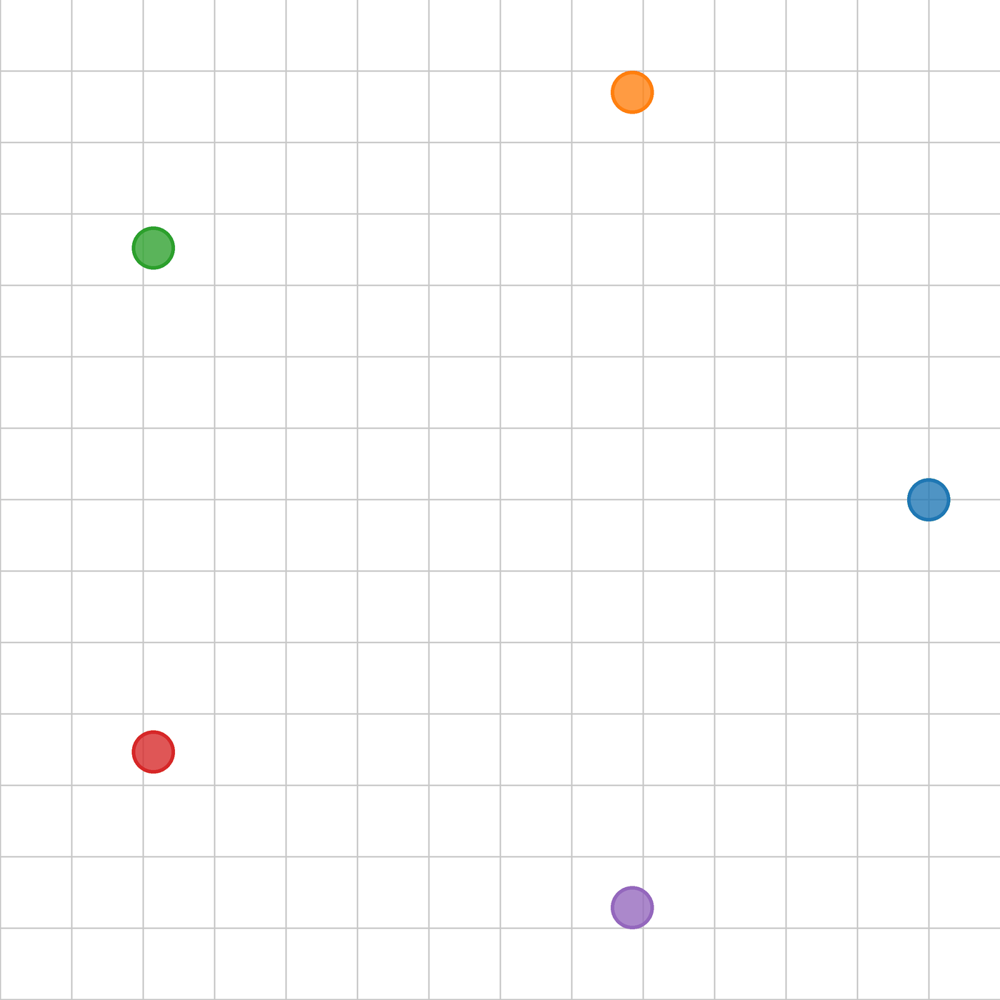

In [12]:
VIS_TRAJ_AGENTS = set(range(0, 25))

colors =  ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
trcolors =  ['#1f77b4c8', '#ff7f0ec8', '#2ca02cc8', '#d62728c8', '#9467bdc8', '#8c564bc8', '#e377c2c8', '#7f7f7fc8', '#bcbd22c8', '#17becfc8']

colors = colors[:5]
trcolors = trcolors[:5]
WHITE = (255, 255, 255)
step = 0
images = []

min_x = -7
min_y = -7
max_x = 7
max_y = 7
points_per_unit = 100
offset = np.array([min_x, min_y])

resolution_x = (max_x - min_x) * points_per_unit
resolution_y = (max_y - min_y) * points_per_unit

points_per_unit *= 2
resolution_x *= 2
resolution_y *= 2


grid_step = 1
grid_x = np.arange(0, resolution_x, grid_step * points_per_unit)
grid_y = np.arange(0, resolution_y, grid_step * points_per_unit)

line_width = int(0.07 * points_per_unit)
circle_outline = int(0.05 * points_per_unit)

base_im = Image.new('RGB', (resolution_x, resolution_y), WHITE)
draw = ImageDraw.Draw(base_im, 'RGBA')

for x in grid_x: 
    draw.line(((x, 0), (x, resolution_y)), width=4, joint='curve', fill=(200,200,200))
for y in grid_y: 
    draw.line(((0, y), (resolution_x, y)), width=4, joint='curve', fill=(200,200,200))

del draw

for time_step in range(len(log_np)-1):
    im = base_im.copy()
    draw = ImageDraw.Draw(im, 'RGBA')

    for a in range(agents_num):
        path = []
        for pos in log_np[:time_step+1, a, 0:2]:
            pos = pos - offset
            path.append((pos[0] * points_per_unit, pos[1] * points_per_unit))
        draw.line(path, width=line_width, joint='curve', fill=colors[(a)%len(colors)])
        
    for a in range(agents_num):
        if (time_step > 0) and (a in VIS_TRAJ_AGENTS):
            for tr_i, tr in enumerate(log_traj[time_step][a]):                
                path = []
                for pos in tr[::5, 0:2]:
                    pos = pos - offset
                    path.append((pos[0] * points_per_unit, pos[1] * points_per_unit))
                draw.line(path, width=line_width//2, joint='curve', fill=colors[(a-1)%len(colors)])

    for a in range(agents_num):
        a_pos = (log_np[time_step, a, 0:2] - offset) * points_per_unit
        agent_radius = agents_params[a][AGENT_SIZE] * points_per_unit
        draw.ellipse ((a_pos[0] - agent_radius, a_pos[1] - agent_radius, a_pos[0]+agent_radius, a_pos[1]+agent_radius), fill=trcolors[(a)%len(trcolors)], outline=colors[(a)%len(colors)], width=circle_outline)


    im = ImageOps.flip(im)
    im = im.resize((resolution_x // 2, resolution_y // 2), resample=Image.LANCZOS)
    images.append(im)
    
animation_name = "mppi_demo"
animation_ext = ".gif"

images[0].save(animation_name+animation_ext, save_all=True, append_images=images[1:], optimize=False, duration=100, loop=0)
display(Img(filename = animation_name+animation_ext, width = 800, height = 800))